## Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## importing stuff
import os
import pickle
from sys import path as syspath
syspath.append(os.path.expanduser("~/srdjan_functs/"))
import numpy as np
np.corrcoef(*np.random.randn(2,3))
import matplotlib.pyplot as plt
import warnings
with warnings.catch_warnings():
    warnings.filterwarnings("ignore")
    from caiman import movie as cmovie
    from caiman import load  as cload

%config InlineBackend.figure_format = 'retina'
import PicklePicker as pp
from IPython.display import display
import pandas as pd
from islets.Recording import Recording, saveMovie
from islets.Regions1 import Regions
from islets.numeric import power_spectrum, rebin
from islets.utils import show_movie, saveRois
from matplotlib.colors import LogNorm
from islets.Recording import import_data
from islets.Regions1 import load_regions
# from islets.utils import rgb_to_hex
import bioformats as bf

In [3]:
bf.javabridge.start_vm(class_path=bf.JARS)

In [4]:
rec = Recording("/data/Sandra/2020/2020_11_19/Experiment76.lif")

Recording /data/Sandra/2020/2020_11_19/Experiment76.lif not yet preprocessed. Preprocessing takes a few seconds and will speed up the usage later... 

/home/jupyter-srdjan/srdjan_functs/islets/Recording.py:135: UserWarning: Could not parse metadata. (<class 'PermissionError'>, PermissionError(13, 'Permission denied'), <traceback object at 0x7fccf03f47d0>)
  warn(f"Could not parse metadata. {exc_info()}")


In [5]:
rec.calc_gaps()

In [6]:
rec.metadata

,Name,SizeT,SizeX,SizeY,SizeZ,pxSize,pxUnit,bit depth,Frequency,Start time,End time,Duration,line scan,gap
0,Series001,931,256,256,1,0.967728,µm,uint8,19.811461,2020-11-19 12:13:31,2020-11-19 12:14:17.993000031,0 days 00:00:46.993000031,none,NaN
1,Series002,19697,256,256,1,0.993214,µm,uint8,19.789178,2020-11-19 12:14:54,2020-11-19 12:31:29.341999054,0 days 00:16:35.341999054,none,36.006999


In [7]:
serToImport = "Series001"

In [8]:
restrict = None

In [9]:
rec.import_series(serToImport, restrict=restrict)

In [10]:
movie = cmovie(
    rec.Series[serToImport]["data"],
    fr = rec.Series[serToImport]["metadata"]["Frequency"],
              )

In [11]:
metadata = rec.Series[serToImport]["metadata"]

In [12]:
saveMovie(movie, "embed")

In [13]:
regions = Regions(movie)

In [14]:
regionsmean = Regions(movie, mode="mean")

In [17]:
regionsmean.examine(debug=True)

In [18]:
traces = np.vstack(regions.df.trace)

In [19]:
from islets.numeric import power_spectrum

In [20]:
fr,pw = power_spectrum(traces, fr=movie.fr, mean=False)

In [29]:
from islets.numeric import runningAverage

(29.894841115129026, 39.99793084438362)

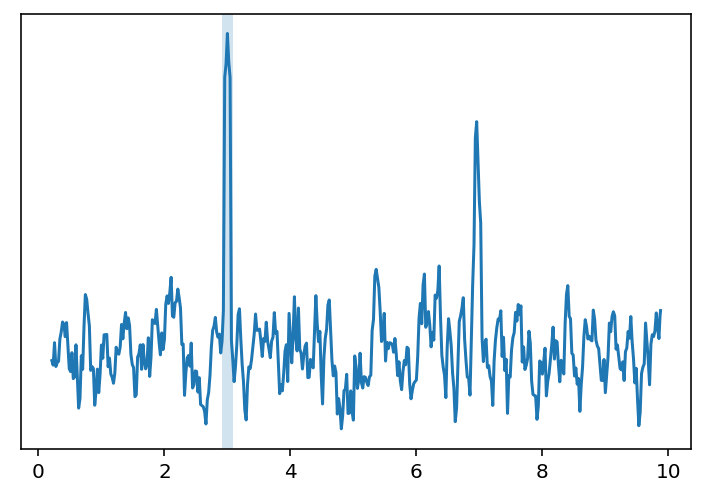

In [42]:
nr = 5
x = runningAverage(fr, nr)
y = np.abs(pw)
y = runningAverage(np.abs(pw).mean(0),nr)
y = y[x>.2]
x = x[x>.2]
plt.plot(x,y)
plt.yscale("symlog")
yl = plt.ylim()
ff = (fr>2.9) & (fr<3.1)
plt.fill_between(fr[ff],[1e10]*ff.sum(), [1e-10]*ff.sum(), alpha = .2)
plt.ylim(yl)

In [44]:
powerInPart = np.abs(pw)[:,ff].sum(1)

In [45]:
powerTot = np.abs(pw).sum(1)

In [46]:
partFrac = powerInPart/powerTot

(array([ 2.,  5.,  3.,  5.,  4.,  6.,  4., 10., 14.,  5.,  9.,  1., 10.,
         3.,  8.,  4.,  6.,  6.,  1.,  4.,  5.,  6.,  1.,  5.,  2.,  2.,
         8.,  5.,  5.,  0.,  1.,  6.,  5.,  1.,  2.,  3.,  2.,  2.,  0.,
         1.,  1.,  4.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([0.00468318, 0.00504841, 0.00541364, 0.00577888, 0.00614411,
        0.00650934, 0.00687457, 0.00723981, 0.00760504, 0.00797027,
        0.0083355 , 0.00870074, 0.00906597, 0.0094312 , 0.00979643,
        0.01016167, 0.0105269 , 0.01089213, 0.01125736, 0.0116226 ,
        0.01198783, 0.01235306, 0.0127183 , 0.01308353, 0.01344876,
        0.01381399, 0.01417923, 0.01454446, 0.01490969, 0.01527492,
        0.01564016, 0.01600539, 0.01637062, 0.01673585, 0.01710109,
        0.01746632, 0.01783155, 0.01819678, 0.01856202, 0.01892725,
        0.01929248, 0.01965771, 0.02002295, 0.02038818, 0.02075341,
        0.02111864, 0.02148388, 0.02184911, 0.02221434, 0.02257957,
        0.02294481]),
 <BarContainer

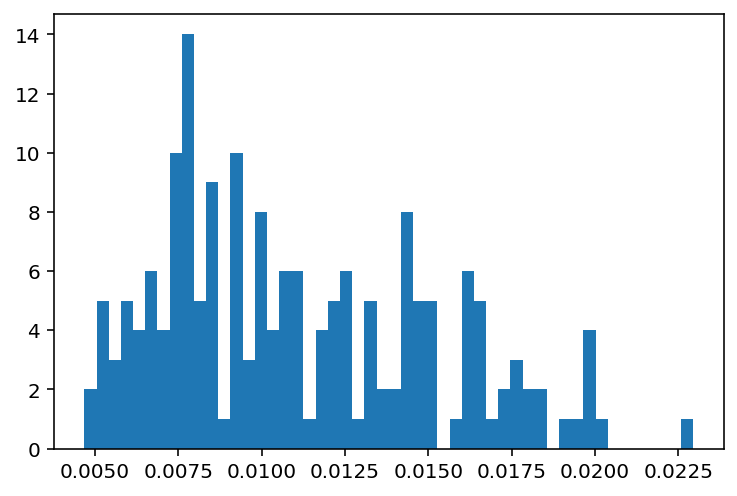

In [48]:
plt.hist(partFrac,50)

In [76]:
powerInPart.shape

(179,)

In [75]:
pw.shape, fr.shape

((179, 466), (466,))

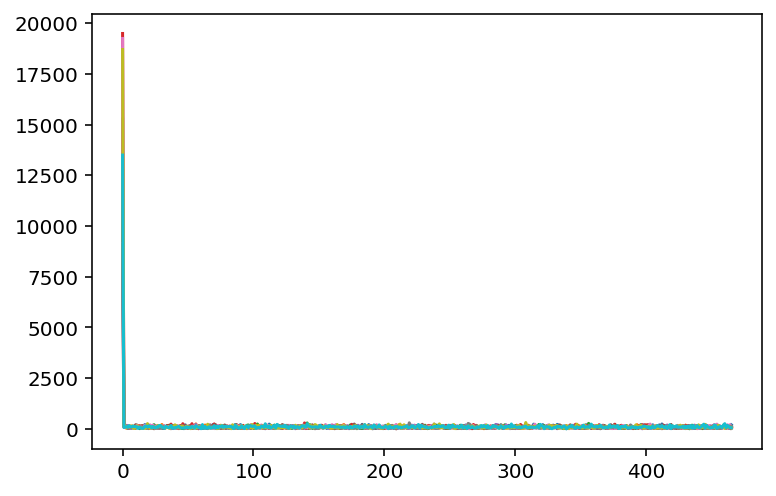

In [78]:
plt.plot(np.abs(pw)[np.argsort(powerInPart)[-10:]].T)

In [65]:
fr.shape

(466,)

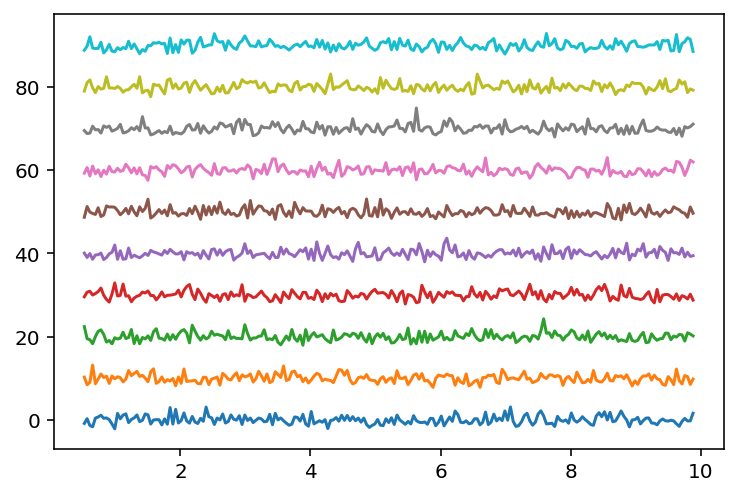

In [90]:
nr = 2
j = 0
for i in np.argsort(powerInPart)[-10:]:
    yf = np.abs(pw)[i].copy()
    yf = rebin(yf,nr)
    x = rebin(fr,nr)
    yf = yf[x>.5]
    yf -= yf.mean()
    yf /= yf.std()
    plt.plot(x[x>.5], yf+ j*10)
    j += 1

In [49]:
regions.df["prominence"] = partFrac

In [51]:
ii = regions.df.sort_values("prominence", ascending=False).index[:10]

In [53]:
y[]

Int64Index([2704, 2631, 2775, 328, 2762, 2630, 2629, 435, 2677, 1151], dtype='int64')

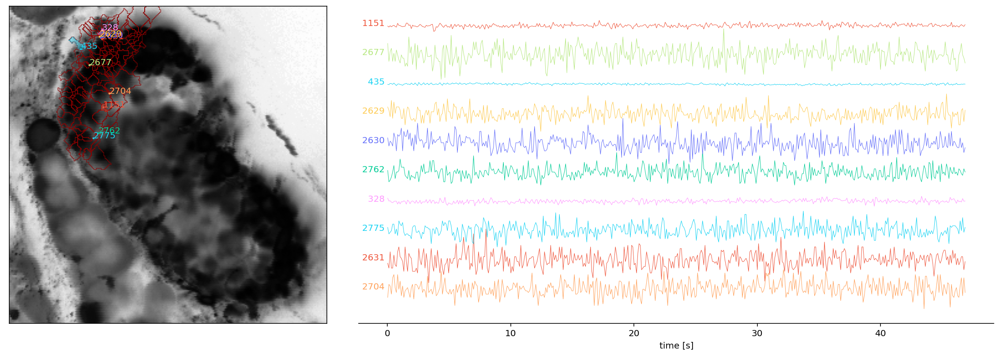

In [55]:
regions.plotTraces(ii, freqShow=10)

In [52]:
regions.examine(startShow=ii)

In [18]:
#     if len(pathToCorrected):
#         movie = cload(
#             pathToCorrected,
#             fr=metadata.Frequency,
#             outtype=metadata['bit depth']
#         )
#         FrameRange = metadata.frame_range
#         movie = movie[FrameRange[0]:FrameRange[1]]
#     else:
#         movie = cmovie(
#             rec.Series[serToImport]['data'],
#             fr=metadata.Frequency
#         )

In [27]:
# ser = serToImport

In [28]:
saveDir = os.path.join(rec.folder, rec.Experiment+"_analysis", ser)

In [29]:
if len(rec.metadata)==1:
    movieFilename = os.path.join(saveDir, os.path.splitext(rec.Experiment)[0]+".mp4")
else:
    movieFilename = os.path.join(saveDir, rec.Experiment+"_"+ser+".mp4")

In [42]:
movie.fr = None

In [31]:
# metadata.pxSize

In [ ]:
def process_movie(movie, metadata, test=False, debug=False, verbose=0):
    


    if metadata.pxSize<.8:
        if args.verbose: print ("Resizing the movie resolution by 2...")
        movie = movie.resize(1/2,1/2,1)
        metadata.pxSize *= 2
        metadata.SizeX /= 2
        metadata.SizeY /= 2

    writeMovie = True
    if os.path.isfile(movieFilename):
        if args.verbose: print("Movie already exists, ", end="")
        if args.leave_movie:
            writeMovie = False
            if args.verbose: print("and I leave it be.")
        else:
            if args.verbose: print("and I'll rewrite it.")
    if writeMovie:
        if args.verbose: print("Writing the movie...")
        if not args.test: saveMovie(movie,movieFilename)

    if not args.only_movie: 


        #### protocol filename
        protocolFilename = movieFilename.replace(".mp4", "_protocol.txt")
        if not os.path.isfile(protocolFilename):
            if args.verbose: print("placed dummy protocol file at", protocolFilename)
            if not args.test:
                DataFrame([[None]*4],columns=["compound","concentration","begin","end"]).to_csv(protocolFilename,index=False)

        filtSizes = get_filterSizes(metadata.pxSize)

        # anull saturated above threshold
#         Nsatur = (movie==movie.max()).sum(0)
#         toAnull = np.where(Nsatur>len(movie)*fracSaturTh)
#         movie[(slice(None), )+toAnull] = 0


        for spFilt in filtSizes:
            if args.verbose: print ("\t"*2,"#"*5,spFilt)

            pickleFile = os.path.join(saveDir, ".".join(map(str,spFilt))+"_rois.pkl")
            if os.path.isfile(pickleFile) and args.leave_pickles:
                if args.verbose: print ("already exists, skipping.")
                continue
            else:
                if args.verbose: print ("processing with filter size of ", spFilt)

            regions = Regions(movie,gSig_filt=spFilt,diag=True)
            regions.time += t0
            if args.verbose:
                print (f"initiallized with {len(regions.df)} rois.")

            regions.purge_lones((min(spFilt)*.4)**2, verbose=args.verbose)
            regions.sortFromCenter()
            regions.calcTraces()
            regions.metadata = metadata
            if not args.test: 
                saveRois(regions, saveDir, filename= ".".join(map(str,spFilt)), add_date=False, formats=["vienna"])

            # preview image
            del regions